# Context

Simple metrics for the event related dataset (where each slow wave can have multiple sources)

# Imports

In [1]:
from skimage import io
import skimage
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, uniform_filter
import pickle

In [2]:
import imageio
from pathlib import Path

In [3]:
from PIL import Image
import os

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec

In [5]:
import matplotlib.animation
from IPython.display import HTML
matplotlib.rcParams['animation.embed_limit'] = 2**128

### Import our custom utility methods

In [6]:
import sys
%reload_ext autoreload
%autoreload 2
sys.path.append('../..')

from utils.visualization_tools import *
import utils.visualization_tools
from utils.data_transformations import *
import utils.data_transformations
from utils.diverse import *
import utils.diverse

In [7]:
def load_files_in_folder(folder):
    files = os.listdir(folder)
    files.sort()
    paths = [os.path.join(folder, f) for f in files]
    
    tensors = [np.load(f) for f in paths]
    return tensors, files

In [8]:
import pickle

In [445]:
with open("../../../../main_experiment/sparse_data/dataset.pkl", "rb") as f:
    dataset = pickle.load(f)

In [446]:
slow_wave_ids = list(dataset["sws"].keys())
print(len(slow_wave_ids))

2524


In [447]:
#dataset["sws"][slow_wave_ids[0]].keys()

In [448]:
experiments = list(dataset["exp"].keys())

In [452]:
iso = np.array([dataset["sws"][k]["iso"] for k in slow_wave_ids])
width = np.array([dataset["sws"][k]["width"] for k in slow_wave_ids])
height = np.array([dataset["sws"][k]["height"] for k in slow_wave_ids])
shape = np.array([dataset["sws"][k]["shape"] for k in slow_wave_ids])
interpolated = np.array([dataset["sws"][k]["interpolated"] for k in slow_wave_ids])
hemo = np.array([dataset["sws"][k]["hemo"] for k in slow_wave_ids])
correlation = np.array([dataset["sws"][k]["correlation"] for k in slow_wave_ids])
gcamp_aligned = np.array([dataset["sws"][k]["gcamp_aligned"] for k in slow_wave_ids])
hemo_aligned = np.array([dataset["sws"][k]["hemo_aligned"] for k in slow_wave_ids])

start = np.array([dataset["sws"][k]["start"] for k in slow_wave_ids])
stop = np.array([dataset["sws"][k]["stop"] for k in slow_wave_ids])
file_id = np.array([dataset["sws"][k]["file_id"] for k in slow_wave_ids])

In [451]:
hemo_means = np.array([[dataset["exp"][exp][run]["hemo_mean"] 
                        for run in dataset["exp"][exp].keys()] 
                        for exp in experiments])
gcamp_means = np.array([[dataset["exp"][exp][run]["gcamp_mean"] 
                        for run in dataset["exp"][exp].keys()] 
                        for exp in experiments])

In [430]:
#plt.plot(hemo_means[0][0][:2000])
#plt.plot(gcamp_means[0][0][:2000])

In [411]:
from scipy.spatial import ConvexHull

Text(0, 0.5, 'Probability density')

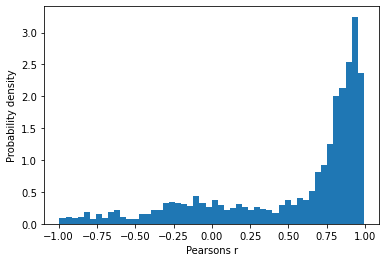

In [349]:
fig, ax = plt.subplots(1)
_ = ax.hist(correlations, bins=50, density = True)
ax.set_xlabel("Pearsons r")
ax.set_ylabel("Probability density")

In [226]:
%%capture
where = np.abs(correlation) < .25
ani = plot_animation([gcamp_aligned[where], hemo_aligned[where]], n_frames= 100).to_jshtml()

In [227]:
HTML(ani)

In [252]:
%%capture
where = correlation < -.25
ani = plot_animation([gcamp_aligned[where], hemo_aligned[where]], n_frames= 100).to_jshtml()

In [253]:
HTML(ani)

In [240]:
%%capture
ani = plot_animation([gcamp_aligned[::10], hemo_aligned[::10]], n_frames= 250).to_jshtml()

In [241]:
HTML(ani)

152.15882682023303


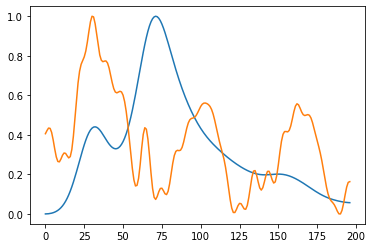

In [188]:
i = 12
print(np.max(hemo_aligned[where][i]))
plt.plot(normalize(gcamp_aligned[where][i]))
plt.plot(normalize(hemo_aligned[where][i]))

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00


Slow waves with an amplitude below 5% signal change are excluded from the anlaysis.


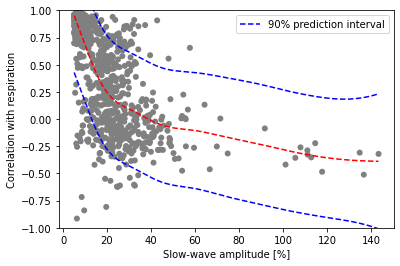

In [313]:
from pygam import LinearGAM

where = height>5
large_wave_height = height[where]
large_wave_correlation = correlation[where]

gam = LinearGAM(n_splines=25).gridsearch(np.array([large_wave_height]).T, large_wave_correlation)
XX = gam.generate_X_grid(term=0, n=500)

fig, ax = plt.subplots(1)
ax.plot(XX, gam.predict(XX), 'r--')
ax.plot(XX, gam.prediction_intervals(XX, width=.90).T[0], color='b', ls='--', label = '90% prediction interval')
ax.plot(XX, gam.prediction_intervals(XX, width=.90).T[1], color='b', ls='--')

ax.scatter(X, y, facecolor='gray', edgecolors='none')
ax.set_ylim(-1,1)
ax.set_xlabel("Slow-wave amplitude [%]")
ax.set_ylabel("Correlation with respiration")
ax.legend()

print("Slow waves with an amplitude below 5% signal change are excluded from the anlaysis.")

Text(0, 0.5, 'Probability density')

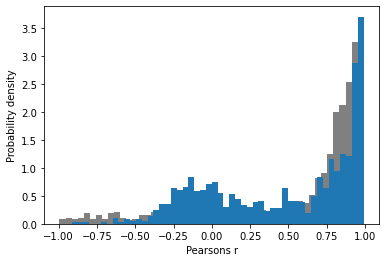

In [322]:
fig, ax = plt.subplots(1)
_ = ax.hist(correlations, bins=50, density = True, color = "gray")
_ = ax.hist(correlations[where], bins=50, density = True)

ax.set_xlabel("Pearsons r")
ax.set_ylabel("Probability density")

In [62]:
len(height[height>5])

948

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00


Text(0, 0.5, 'Duration of slow-wave')

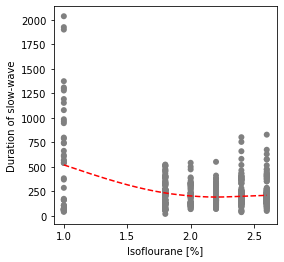

In [340]:
gam = LinearGAM(n_splines=25).gridsearch(np.array([iso[height>5]]).T, width[height>5])
XX = gam.generate_X_grid(term=0, n=500)

fig, ax = plt.subplots(1, figsize=(4,4))
ax.plot(XX, gam.predict(XX), 'r--')
#ax.plot(XX, gam.prediction_intervals(XX, width=.90).T[0], color='b', ls='--', label = '90% prediction interval')
#ax.plot(XX, gam.prediction_intervals(XX, width=.90).T[1], color='b', ls='--')

ax.scatter(iso[height>5], width[height>5], facecolor='gray', edgecolors='none')
ax.set_xlabel("Isoflourane [%]")
ax.set_ylabel("Duration of slow-wave")

In [25]:
np.corrcoef(height[height>5], iso[height>5])

array([[ 1.        , -0.31238261],
       [-0.31238261,  1.        ]])

/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero en

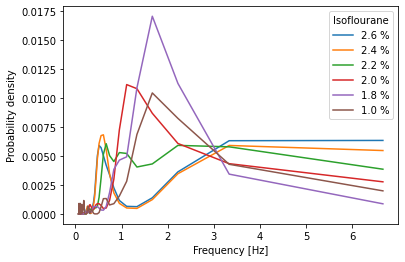

In [344]:
levels = list(set(iso))
levels.sort(reverse=True)
fig, ax = plt.subplots()
for level in levels:
    cond = width[iso==level]
    y, x = np.histogram(cond, density = True, bins=100, range=[0,1500])
    x = 100/x
    ax.plot(x[:-1],gaussian_filter(y,1), label = str(level)+ " %")
ax.set_xlabel("Frequency [Hz]")
ax.set_ylabel("Probability density")
ax.legend(title="Isoflourane")

/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in true_divide
  import sys
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero en

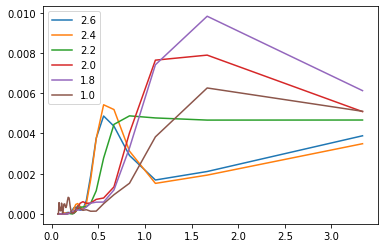

In [332]:
levels = list(set(iso))
levels.sort(reverse=True)

for level in levels:
    cond = width[iso==level]
    y, x = np.histogram(cond, density = True, bins=50, range=[0,1500])
    x = 100/x
    plt.plot(x[:-1],gaussian_filter(y,1), label = str(level))
plt.legend()

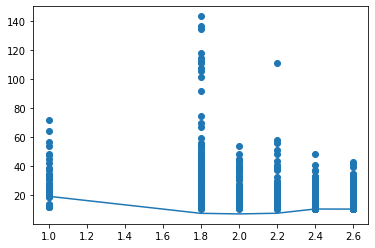

In [333]:
sel_iso = iso[height>10]
sel_height = height[height>10]
plt.scatter(sel_iso, sel_height)
plt.plot(levels, [np.mean(x) for x in [height[iso == level] for level in levels]])

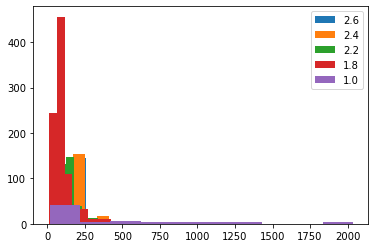

In [334]:
plt.hist(width[iso==2.6], label = "2.6")
plt.hist(width[iso==2.4], label = "2.4")
plt.hist(width[iso==2.2], label = "2.2")
plt.hist(width[iso==1.8], label = "1.8")
plt.hist(width[iso==1.0], label = "1.0")
plt.legend()

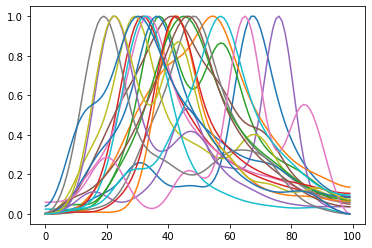

In [113]:
for i, x in enumerate(interpolated[height > 5]):
    if i > 100 or i <80:
        continue
    plt.plot(normalize(gaussian_filter(x, 5)))


In [116]:
hemo

array([NestedDict(<class 'utils.diverse.NestedDict'>, {}),
       NestedDict(<class 'utils.diverse.NestedDict'>, {}),
       NestedDict(<class 'utils.diverse.NestedDict'>, {}), ...,
       NestedDict(<class 'utils.diverse.NestedDict'>, {}),
       NestedDict(<class 'utils.diverse.NestedDict'>, {}),
       NestedDict(<class 'utils.diverse.NestedDict'>, {})], dtype=object)